<a href="https://colab.research.google.com/github/kosmos1985/computer-vision-py/blob/main/02_intro_opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

* @author: krakowiakpawel9@gmail.com  
* @site: e-smartdata.org

### **Praca z obrazami**

Notebook ma na celu przybliżenie podstawowych operacji wykonywanych na obrazie przy użyciu biblioteki OpenCV

Wykorzystamy najpopularniejszą bibliotekę do pracy przy projektach Computer Vision: [OpenCV](https://opencv.org/)


#### **Spis treści:**

1. [Instalacja i import bibliotek](#a1)
2. [Zmiana rozmiaru zdjęcia](#a2)
3. [Rotacja](#a3)
4. [Progowanie](#a4)
5. [Operacja splotu, wygładzanie](#a5)
6. [Generowanie losowego obrazu](#a6)
7. [Detekcja krawędzi](#a7)
8. [Erozja](#a8)

#### **Uwagi:**
>Kurs został stworzony przy pomocy biblioteki w wersji 4.1.2.  
>Aby zaktualizować bibliotekę OpenCV do aktualniej wersji należy użyć polecenia:
```
!pip install --upgrade opencv-python
```
Bądź zainstalować wybierając konkretną wersję, np.
```
!pip install opencv-python==4.1.2.30
```

### <a name='a1'></a> Instalacja i import bibliotek

In [ ]:
# !pip install -q --upgrade opencv-python

     |████████████████████████████████| 28.3MB 80kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.


In [ ]:
from google.colab.patches import cv2_imshow
import imutils
import numpy as np
import cv2

cv2.__version__

'4.1.2'

### <a name='a2'></a> Zmiana rozmiaru zdjęcia

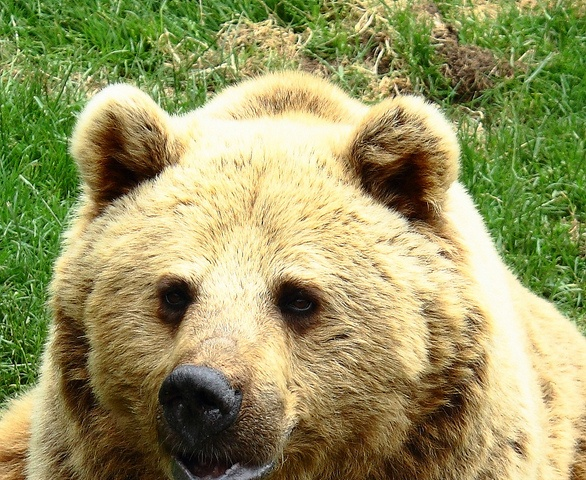

In [ ]:
img = cv2.imread('bear.jpg')
cv2_imshow(img)

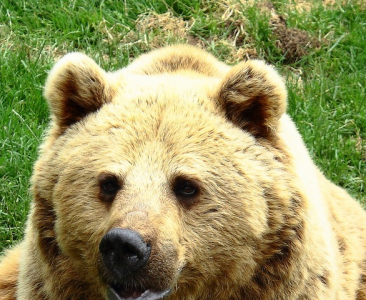

In [ ]:
img_resized = imutils.resize(image=img, height=300)
cv2_imshow(img_resized)

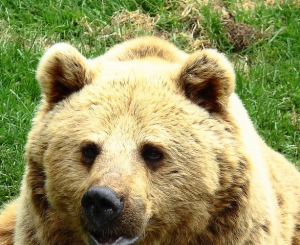

In [ ]:
img_resized = imutils.resize(image=img, width=300)
cv2_imshow(img_resized)

### <a name='a3'></a> Rotacja

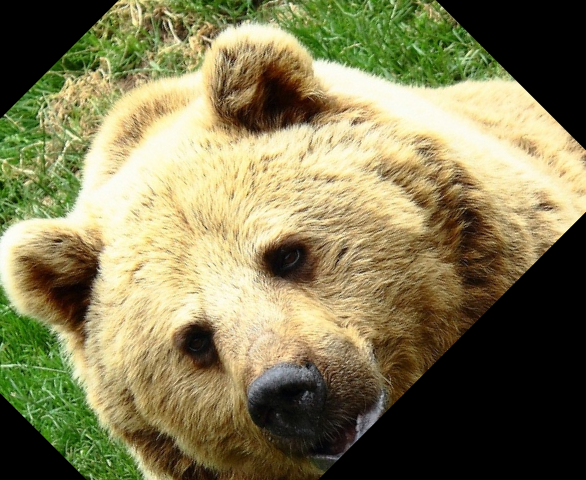

In [ ]:
height, width = img.shape[:2]

M = cv2.getRotationMatrix2D(center=(height // 2, width // 2), angle=45, scale=1)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

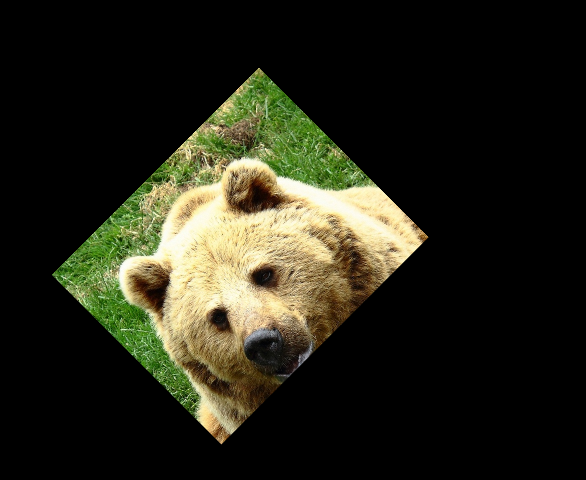

In [ ]:
M = cv2.getRotationMatrix2D(center=(height // 2, width // 2), angle=45, scale=0.5)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

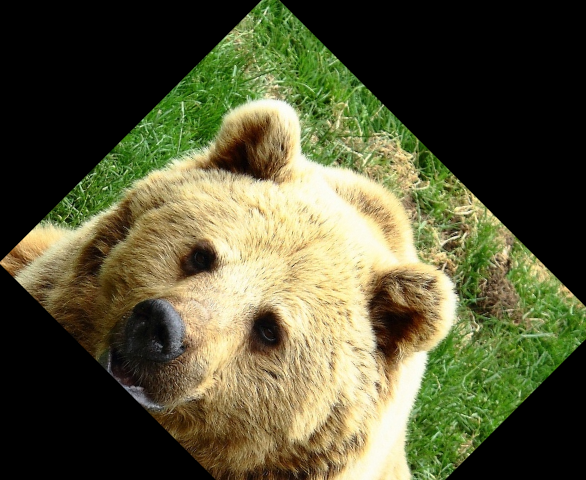

In [ ]:
M = cv2.getRotationMatrix2D(center=(height // 2, width // 2), angle=-45, scale=0.8)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

### <a name='a4'></a> Progowanie

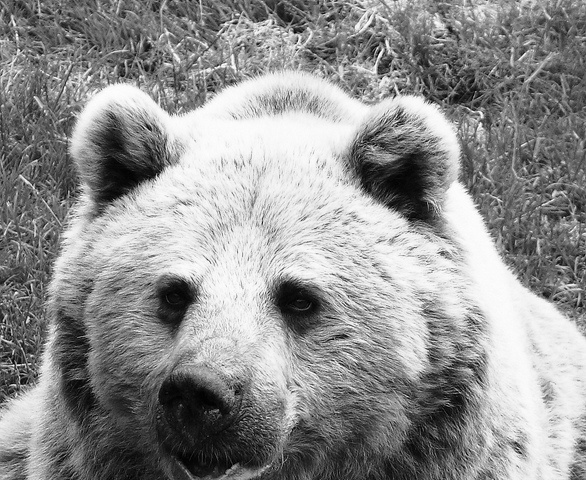

In [ ]:
gray = cv2.cvtColor(src=img, code=cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

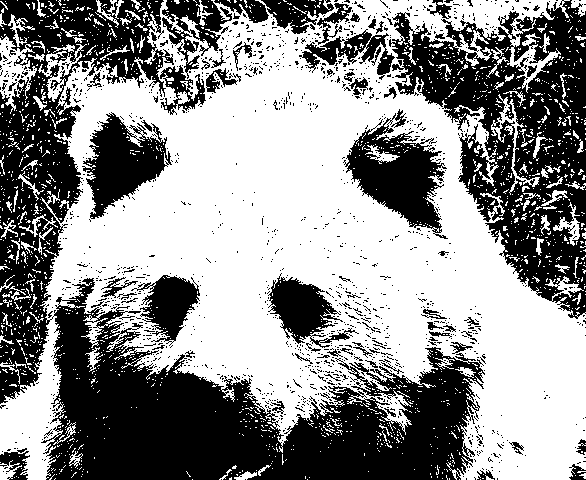

In [ ]:
cv2_imshow(cv2.threshold(src=gray, thresh=125, maxval=255, type=cv2.THRESH_BINARY)[1])

### <a name='a5'></a> Operacja splotu, wygładzanie

Matematyczna operacja na macierzach, która dokonuje splotu macierzy reprezentującej obraz z inną mniejszą zwaną jądrem splotu (filtrem).

Przykładowy obraz:

|    |    |    |    |   |
|----|----|----|----|---|
| 12 | 10 | 8  | 5  | 6 |
| 3  | 1  | 4  | 4  | 5 |
| 6  | 6  | 5  | 4  | 4 |
| 12 | 10 | 11 | 11 | 9 |
| 9  | 8  | 7  | 8  | 4 |

Jądro 3x3:

|   |   |   |
|---|---|---|
| 0 | 0 | 0 |
| 0 | 1 | 0 |
| 0 | 0 | 0 |

Jądro 5x5:

|   |   |   |   |   |
|---|---|---|---|---|
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |

Poprzez zwiększenie rozmiaru jądra uśreniamy wartość piksela na większym obszarze przez co w przypadku rozmawywania dostajemy mocniejszy efekt.

In [ ]:
kernel = np.ones(shape=(5, 5), dtype=np.float32) / 25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

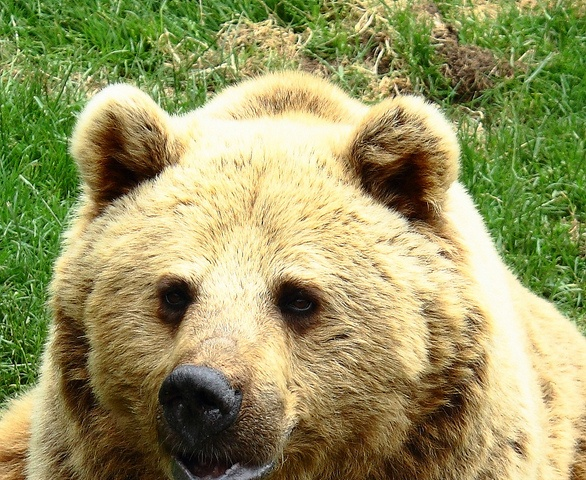

In [ ]:
cv2_imshow(img)

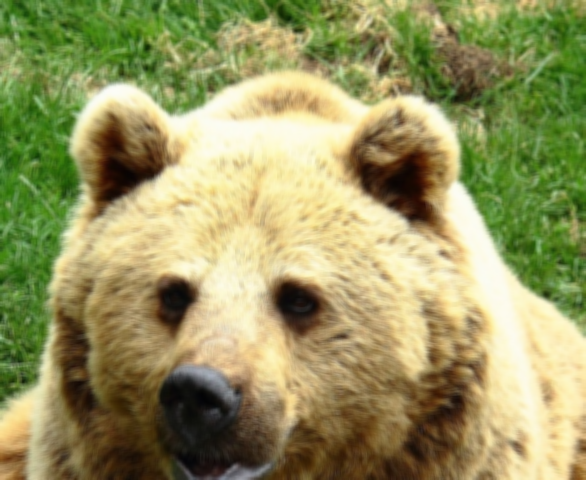

In [ ]:
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

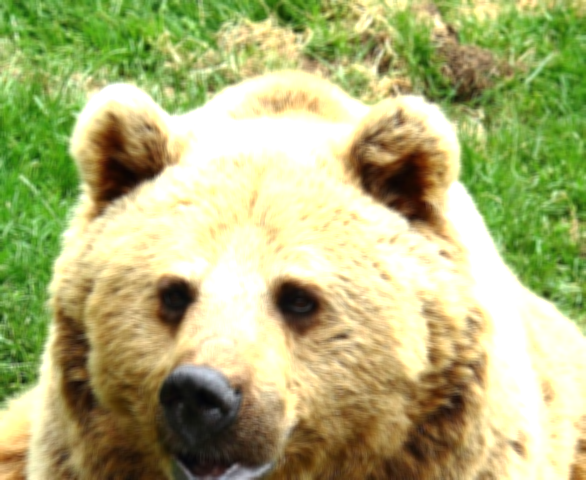

In [ ]:
kernel = np.ones((5, 5), np.float32) / 20
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

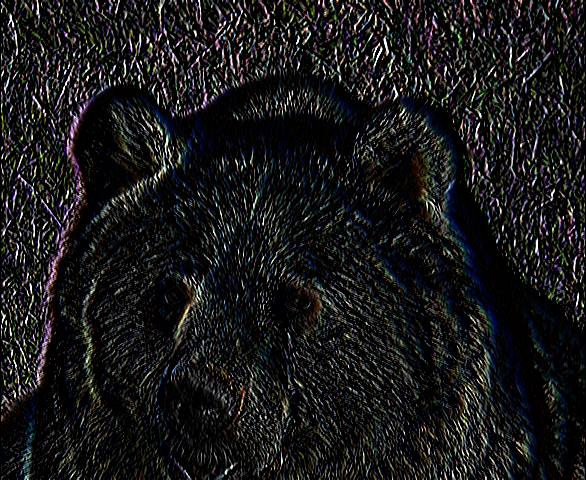

In [ ]:
kernel = np.array([[-1, 0, 1],
                   [-1, 0, 1],
                   [-1, 0, 1]])
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

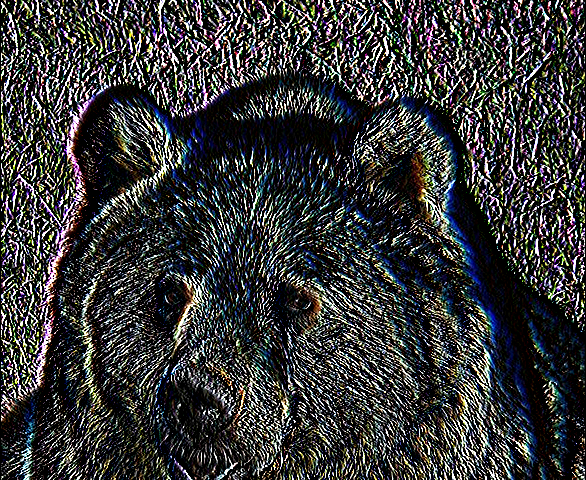

In [ ]:
kernel = np.array([[-1, 0, 1],
                   [-5, 0, 5],
                   [-1, 0, 1]])
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

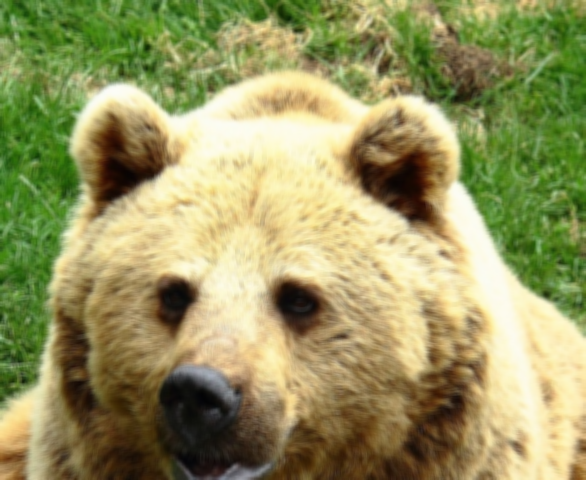

In [ ]:
cv2_imshow(cv2.blur(src=img, ksize=(5, 5)))

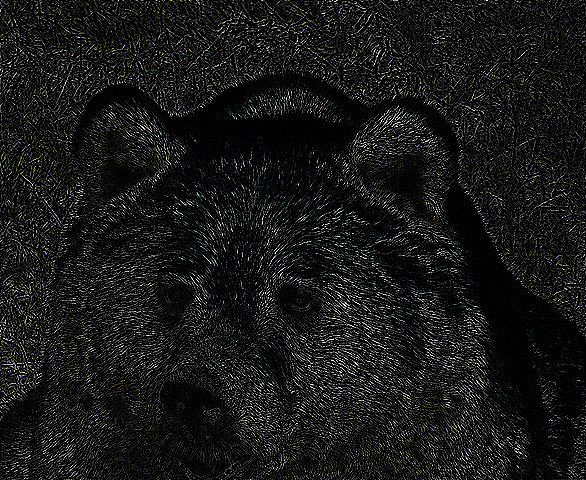

In [ ]:
cv2_imshow(cv2.Laplacian(src=img, ddepth=cv2.CV_64F))

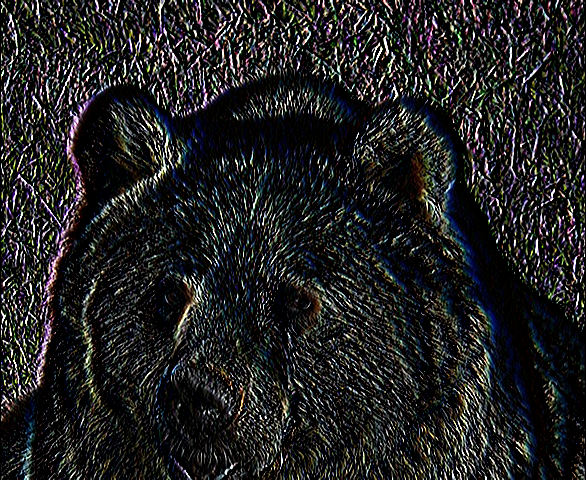

In [ ]:
cv2_imshow(cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=0))

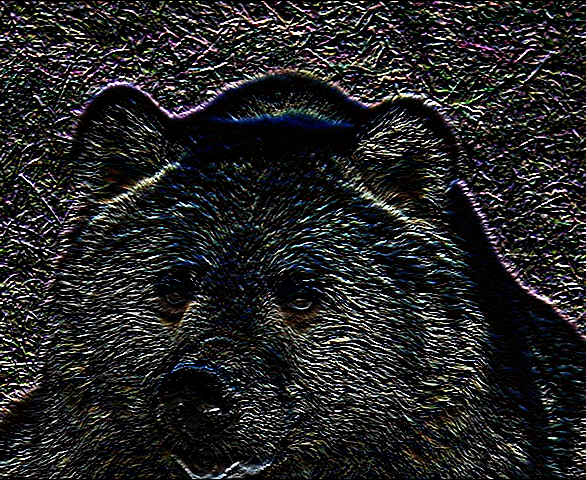

In [ ]:
cv2_imshow(cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1))

### <a name='a6'></a> Generowanie losowego obrazu

In [ ]:
# w skali szarości
array = np.random.randint(low=0, high=256, size=(400, 500))
array

array([[211,  59,   2, ...,  97,  96,  50],
       [189, 132,  56, ..., 223, 137,  99],
       [145, 143,  62, ..., 159, 228,  43],
       ...,
       [152, 120,  96, ..., 101,  13, 212],
       [204,  17,  98, ...,  47, 126,  26],
       [157,  95, 158, ...,  12, 203,  99]])

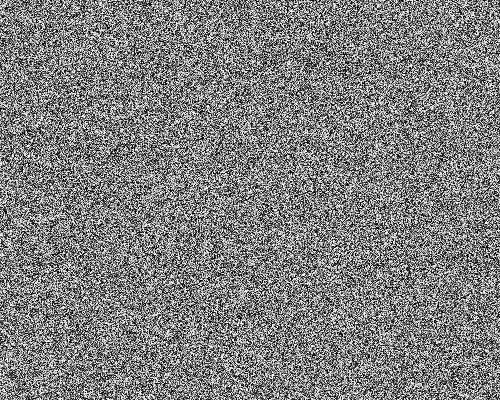

In [ ]:
cv2_imshow(array)

In [ ]:
# kolorowy
array = np.random.randint(low=0, high=256, size=(400, 500, 3))
array

array([[[ 74,  13, 106],
        [ 95,  24,  61],
        [101,  46, 152],
        ...,
        [186,   5, 208],
        [225, 185, 194],
        [177,  35, 178]],

       [[212, 113, 158],
        [ 94,  77, 230],
        [ 22,  23,  69],
        ...,
        [ 11,  17, 220],
        [112, 159, 107],
        [218, 126, 109]],

       [[225,  85,  28],
        [ 11, 138,  50],
        [ 44,  29,  53],
        ...,
        [173, 238, 253],
        [ 24, 120,  63],
        [215, 112, 106]],

       ...,

       [[191,  70, 222],
        [ 97, 163, 216],
        [156,  59, 214],
        ...,
        [215,  25, 148],
        [ 28,  14, 133],
        [  2, 150, 189]],

       [[219,  28, 221],
        [225, 192, 128],
        [219,  48, 245],
        ...,
        [ 37, 134, 109],
        [169, 197, 199],
        [215, 194, 199]],

       [[132, 242, 188],
        [242,  86, 244],
        [196, 188, 199],
        ...,
        [250,  53,  67],
        [147, 203, 140],
        [ 30,  38, 202]]

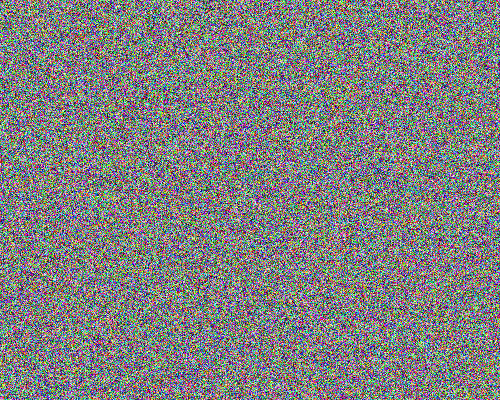

In [ ]:
cv2_imshow(array)

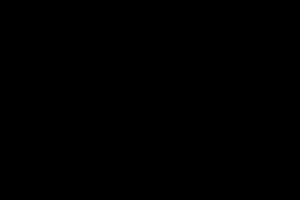

In [ ]:
array = np.zeros(shape=(200, 300))
cv2_imshow(array)

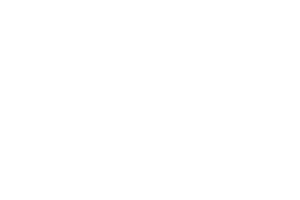

In [ ]:
array = np.full(shape=(200, 300), fill_value=255)
cv2_imshow(array)

### <a name='a7'></a> Detekcja krawędzi

Filtr krawędzi pionowych

|    |   |   |
|----|---|---|
| -1 | 0 | 1 |
| -2 | 0 | 2 |
| -1 | 0 | 1 |

Filtr krawędzi poziomych

|    |    |    |
|----|----|----|
| -1 | -2 | -1 |
| 0  | 0  | 0  |
| 1  | 2  | 1  |

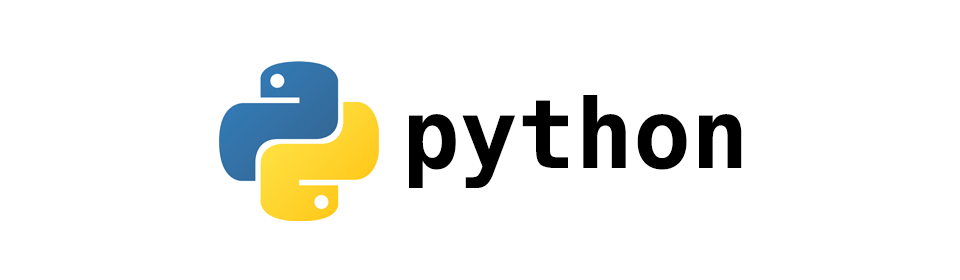

In [ ]:
logo = cv2.imread('python.png')
cv2_imshow(logo)

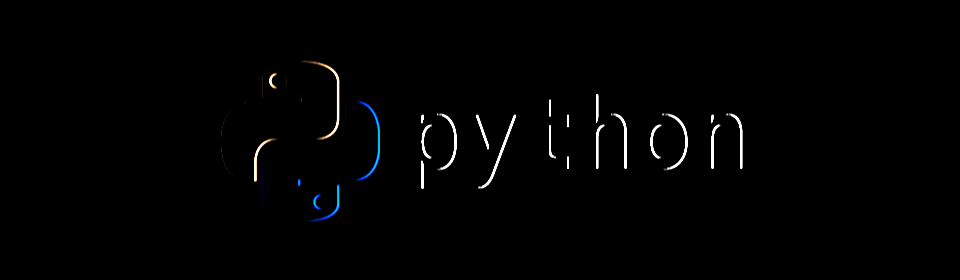

In [ ]:
kernel_vertical = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
output = cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_vertical)
cv2_imshow(output)

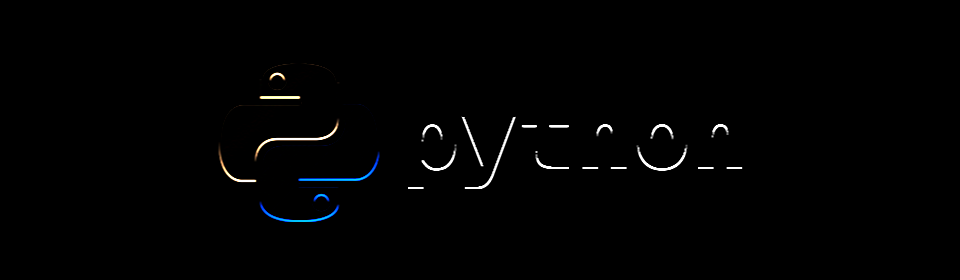

In [ ]:
kernel_horizontal = np.array([[-1, -2, -1], [0 , 0, 0], [1, 2, 1]])
output = cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_horizontal)
cv2_imshow(output)

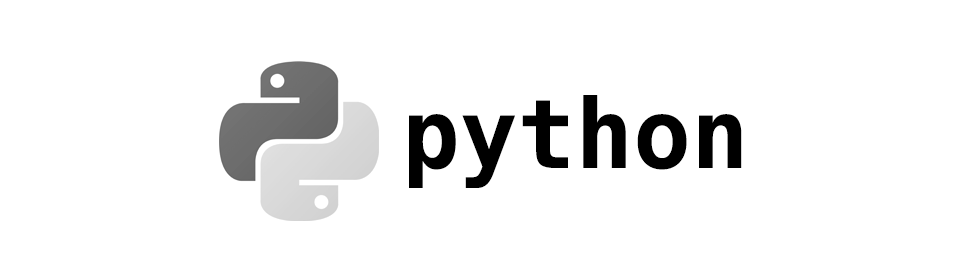

In [ ]:
logo = cv2.imread('python.png', flags=cv2.IMREAD_GRAYSCALE)
cv2_imshow(logo)

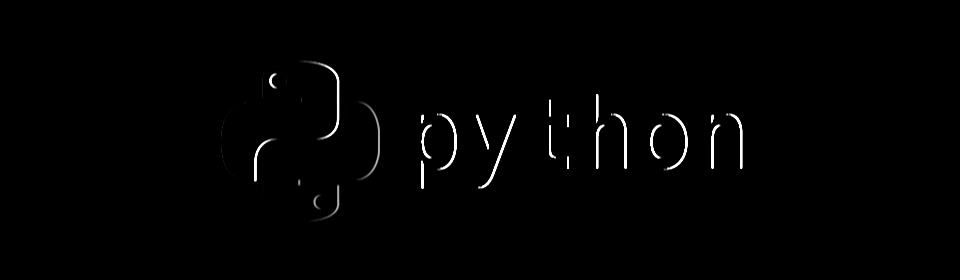

In [ ]:
cv2_imshow(cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_vertical))

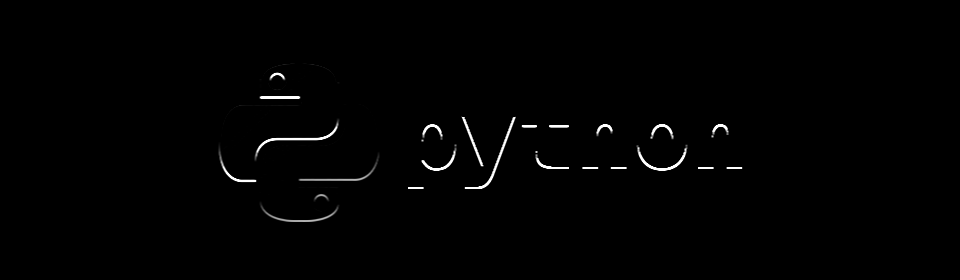

In [ ]:
cv2_imshow(cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_horizontal))

Filtry, którymi się posługujemy są znane pod nazwą Sobel. Bilioteka OpenCV dostarcza także gotową funkcję Sobel.

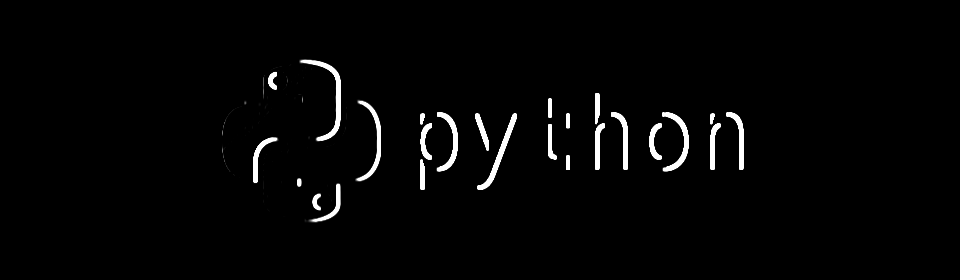

In [ ]:
cv2_imshow(cv2.Sobel(src=logo, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5))

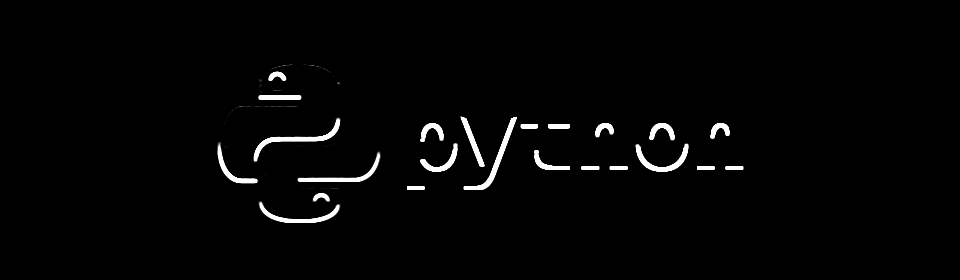

In [ ]:
cv2_imshow(cv2.Sobel(src=logo, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5))

Innym znanym filterm, który pozwala wykrywać krawędzie jest Laplacian.

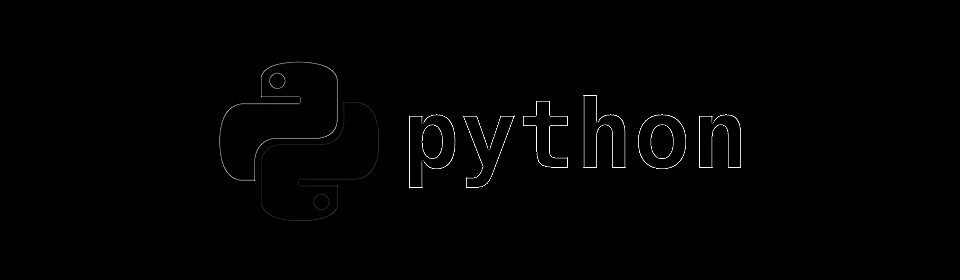

In [ ]:
cv2_imshow(cv2.Laplacian(src=logo, ddepth=cv2.CV_64F))

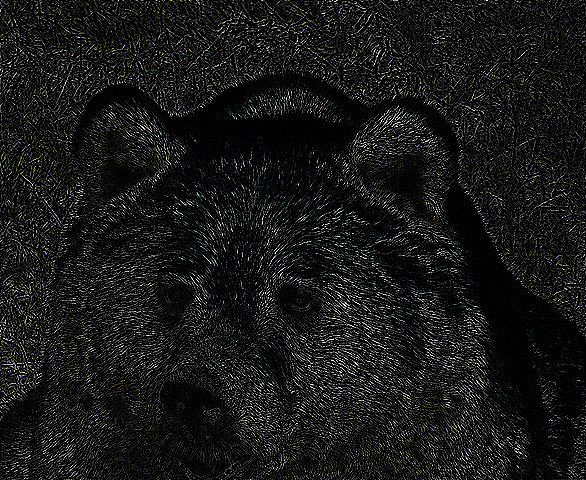

In [ ]:
view = cv2.imread('bear.jpg')
cv2_imshow(cv2.Laplacian(src=view, ddepth=cv2.CV_64F))

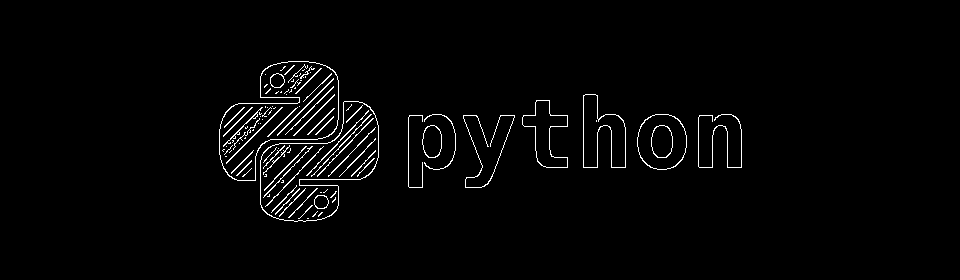

In [ ]:
cv2_imshow(cv2.Canny(image=logo, threshold1=0, threshold2=0))

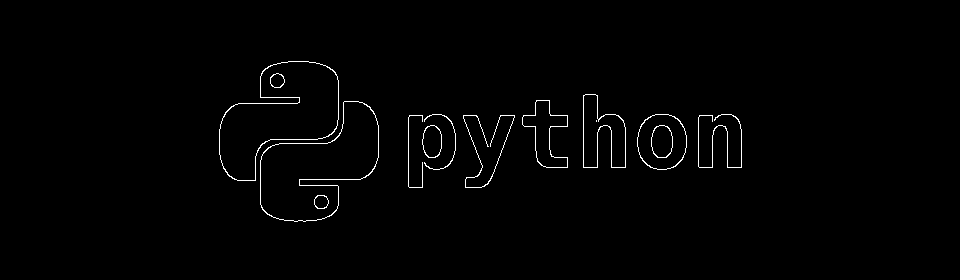

In [ ]:
cv2_imshow(cv2.Canny(image=logo, threshold1=100, threshold2=100))

### <a name='a8'></a> Erozja

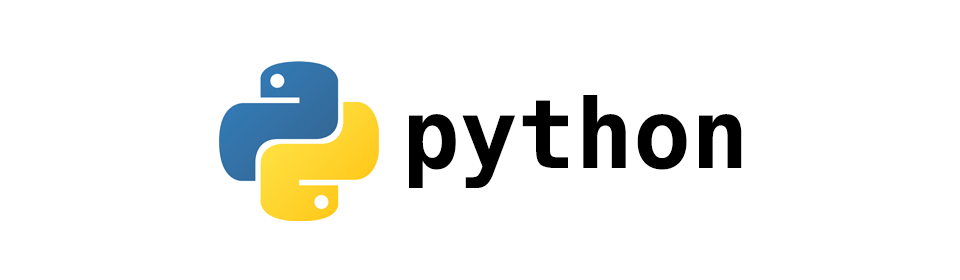

In [ ]:
logo = cv2.imread('python.png')
cv2_imshow(logo)

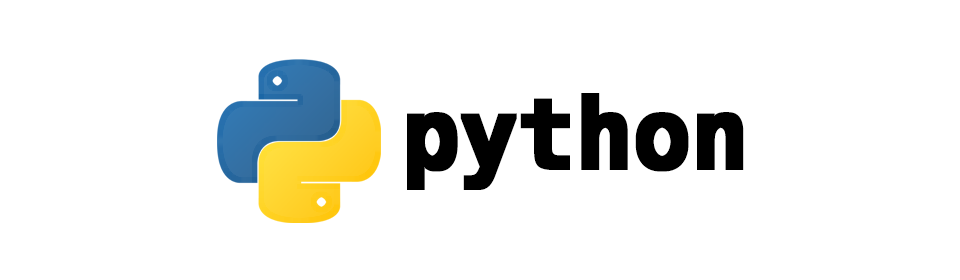

In [ ]:
kernel = np.ones((5, 5), np.uint8)
cv2_imshow(cv2.erode(src=logo, kernel=kernel, iterations=1))

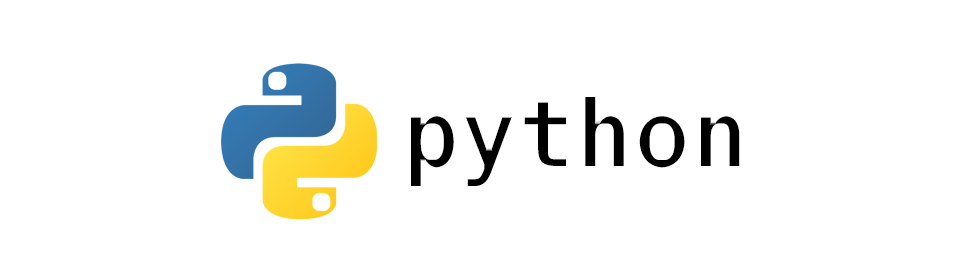

In [ ]:
cv2_imshow(cv2.dilate(src=logo, kernel=kernel, iterations=1))